## TOC:
1. [Main Settings](#sec1)
2. [Clean data](#sec2)
    1. [Clean language data](#sec2a) 
    2. [Clean agricultural suitability data](#sec2b)
    3. [Clean population data](#sec2c)
    4. [Clean elevation data](#sec2d)
    5. [Clean climate data](#sec2e)
3. [Country level analysis](#sec3)
    1. [Aggregate data by country](#sec3a)
    1. [Count languages for countries](#sec3b)
    1. [Calculate distances between countries and coast](#sec3c)
    1. [Calculate country areas](#sec3d)
4. ['Virtual country' level analysis](#sec4)
    1. [Build Grid for virtual countries](#sec4a)
    1. [Count languages for virtual countries](#sec4b)
    1. [Calculate land and water area for virtual countries](#sec4c)
    1. [Calculate distances between virtual countries and coast](#sec4d)
    1. [Aggregate data by virtual countries](#sec4e)
5. [Dyad level analysis](#sec5)
    1. [Create dyad cells](#sec5a)
    1. [Languages spoken in dyad cells](#sec5b)
    1. [Calculate land and water area for dyad cells](#sec5c)
    1. [Calculate distances between dyad cells and coast](#sec5d)
    1. [Aggregate data by dyad cells](#sec5e)
    1. [Create polygon neighbours](#sec5f)

# 1. Main Settings <a class="anchor" id="sec1"></a>

Import packages

In [1]:
import sys, os, geopandas, rasterio, pyproj, numpy, \
         rasterstats, time, matplotlib, csv, pandas
from pyproj import CRS
from matplotlib import pyplot
from matplotlib.colors import PowerNorm
import matplotlib.pyplot as plt
from rasterio.plot import show
from shapely.geometry import Polygon, MultiPolygon
from shapely.ops import nearest_points

Set paths to file folder locations

In [2]:
mainpath = "../data"
outpath = "{}/_output/".format(mainpath)
junkpath = "{}/junk".format(outpath)

Make sure output and junk directories exists. If they don't, create them

In [3]:
if not os.path.exists(outpath):
	os.mkdir(outpath)
if not os.path.exists(junkpath):
    os.mkdir(junkpath)

Input files

In [4]:
cntrs_in = "{}/ne_10m_admin_0_countries/ne_10m_admin_0_countries.shp".format(mainpath)
coast_in = "{}/ne_10m_coastline/ne_10m_coastline.shp".format(mainpath)
water_in = "{}/ne_10m_lakes/ne_10m_lakes.shp".format(mainpath)
wlds_in = "{}/langa.shp".format(mainpath)
suit_in = "{}/suit/suit/hdr.adf".format(mainpath)
popd_in  = "{path}/HYDE/{y}ad_pop/popd_{y}AD.asc"
# elev_in = "{}/elevation/srtmv4_30s/hdr.adf".format(mainpath) 
# temp_in =  "{path}/worldclim/temperature/tmean_30s_bil/tmean_{month}.bil"
# prec_in =  "{path}/worldclim/precipitation/prec_30s_bil/prec_{month}.bil"

Temporary files

In [5]:
wlds_cln = "{}/wlds_cleaned.shp".format(junkpath)
suit_cln = "{}/landquality.tif".format(junkpath)
popd_cln = "{path}/popd_{y}AD.tif"
# elev_cln = "{}/elevation.tif".format(junkpath)
# temp_cln = "{}/temp_mean.tif".format(junkpath)
# prec_cln = "{}/prec_mean.tif".format(junkpath)
vc_shp   = "{}/vcountries.shp".format(junkpath)
vc_wlangs_shp = "{}/vc_withlangs.shp".format(junkpath)
vc_wolangs_shp = "{}/vc_withoutlangs.shp".format(junkpath)
dyad_shp = "{}/dyadcells.shp".format(junkpath)

Output files

In [6]:
cntry_zs_csv = "{}/country_level_zs.csv".format(outpath)
cntry_nlangs_csv = "{}/nlangs_country.csv".format(outpath)
cntry2coast_csv = "{}/centroids_closest_coast.csv".format(outpath)
cntry_areas_csv = "{}/country_areas.csv".format(outpath)
vc_nlangs_csv = "{}/nlangs_vcountries.csv".format(outpath)
vc_areas_csv = "{}/vcareas.csv".format(outpath)
vc_waterarea_csv = "{}/vcwaterareas.csv".format(outpath)
vc2coast_csv = "{}/vccentroids_closest_coast.csv".format(outpath)
vc_zs_csv = "{}/vc_level_zs.csv".format(outpath)
vc_wolangs_zs_csv = "{}/vcnl_level_zs.csv".format(outpath)
dyad_langs_csv = "{}/langs_in_dyadcells.csv".format(outpath)   
dyad_areas_csv = "{}/dyadareas.csv".format(outpath)
dyad_waterarea_csv = "{}/dyadwaterareas.csv".format(outpath)
dyad2coast_csv = "{}/dyadcentroids_closest_coast.csv".format(outpath)
dyad_evtp_csv = "{}/dyads_evtp.csv".format(outpath)
dyad_nghbs_csv = "{}/dyadpolyneighbors.csv".format(outpath)

Other settings

In [7]:
wgs84_crs = CRS.from_string('EPSG:4326') # WGS 1984
wcea_crs = CRS.from_string('esri:54034') # World cylindical equal area projection

# 2. Clean data <a class="anchor" id="sec2"></a>

### 2.A. Clean language data <a class="anchor" id="sec2a"></a>

Open data (and look at it)

In [8]:
wlds_gdf=geopandas.read_file(wlds_in)

In [9]:
wlds_gdf.columns #look at columns/variables in the data

Index(['ID', 'ID_ISO_A3', 'ID_ISO_A2', 'ID_FIPS', 'NAM_LABEL', 'NAME_PROP',
       'NAME2', 'NAM_ANSI', 'CNT', 'C1', 'POP', 'LMP_POP1', 'G', 'LMP_CLASS',
       'FAMILYPROP', 'FAMILY', 'langpc_km2', 'geometry'],
      dtype='object')

In [10]:
wlds_gdf.crs #coorindate system

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

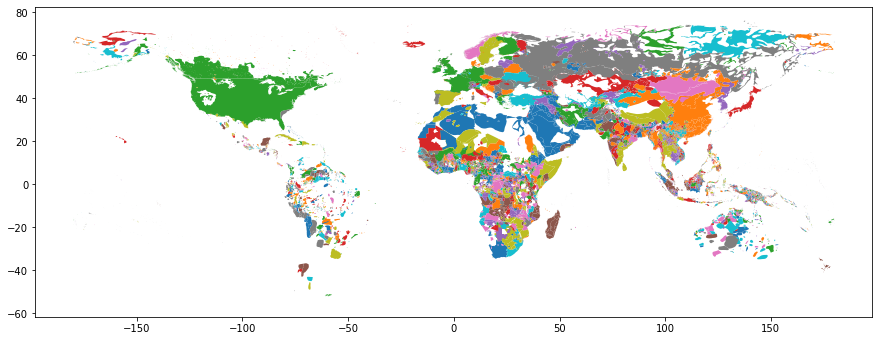

In [11]:
wlds_gdf.plot(column='NAME_PROP', figsize=(15, 10)); #plot all the languages

Add unique feature ID 

In [12]:
wlds_gdf['GID'] = range(1, len(wlds_gdf) + 1)

Rename columns

In [13]:
wlds_gdf=wlds_gdf.rename(columns={'NAME_PROP': 'lnm'})

In [14]:
wlds_gdf[['GID','lnm']] #compare GID with renamed column

,GID,lnm
0,1,Papiamentu
1,2,Grangali
2,3,Pahlavani
3,4,Brahui
4,5,"Pashto, Southern"
...,...,...
7607,7608,French
7608,7609,French
7609,7610,Mandinka
7610,7611,Spanish


Drop field(s)

In [15]:
wlds_gdf=wlds_gdf[['geometry','GID','ID','lnm']]

In [16]:
wlds_gdf.columns #look at remaining columns/variables in the data

Index(['geometry', 'GID', 'ID', 'lnm'], dtype='object')

Save data frame as shape

In [17]:
wlds_gdf.to_file(wlds_cln)

### 2.B. Clean agricultural suitability data  <a class="anchor" id="sec2b"></a>

Open data (and look at it)

In [18]:
suit_rst= rasterio.open(suit_in)

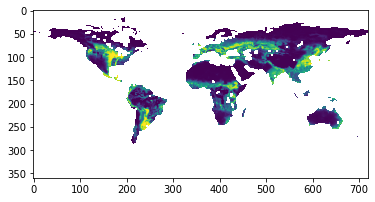

In [19]:
pyplot.imshow(suit_rst.read(1, masked=True), cmap='viridis') #plot suitability raster

In [20]:
suit_rst.profile #display metadata for raster

{'driver': 'AIG', 'dtype': 'float32', 'nodata': -3.4028234663852886e+38, 'width': 720, 'height': 360, 'count': 1, 'crs': None, 'transform': Affine(0.5, 0.0, -180.0,
       0.0, -0.5, 90.0), 'tiled': False}

In [21]:
print(suit_rst.crs) #display input coordinate system (None)

None


Having no coordinate system is a problem, let's fix it!

In [22]:
profile=suit_rst.profile #get profile of original raster

In [23]:
profile.update(driver='GTiff', crs=wgs84_crs) #update profile with CRS and GEOTiff 

In [24]:
suit_arr=suit_rst.read() #read the original raster as an array

In [25]:
with rasterio.open(suit_cln, 'w', **profile) as dst:
    dst.write(suit_arr) #write the array to tiff, using updated profile

### 2.C. Clean population data <a class="anchor" id="sec2c"></a> 

In [26]:
#convert ASCII rasters to GeoTiff
for year in ['1500','1990','2000']:
    rast_o=rasterio.open(popd_in.format(path=mainpath,y=year))
    prf=rast_o.profile.copy()
    prf.update({"driver": "GTiff","crs": wgs84_crs}) #switch from ASCII to GEOTiff and set CRS
    img_a=rast_o.read(1)
    with rasterio.open(popd_cln.format(path=junkpath,y=year), 'w', **prf) as dst:
        dst.write(img_a, 1)

Plot the cleaned data

In [27]:
countries_gdf=geopandas.read_file(cntrs_in) #Open the countries data to plot borders

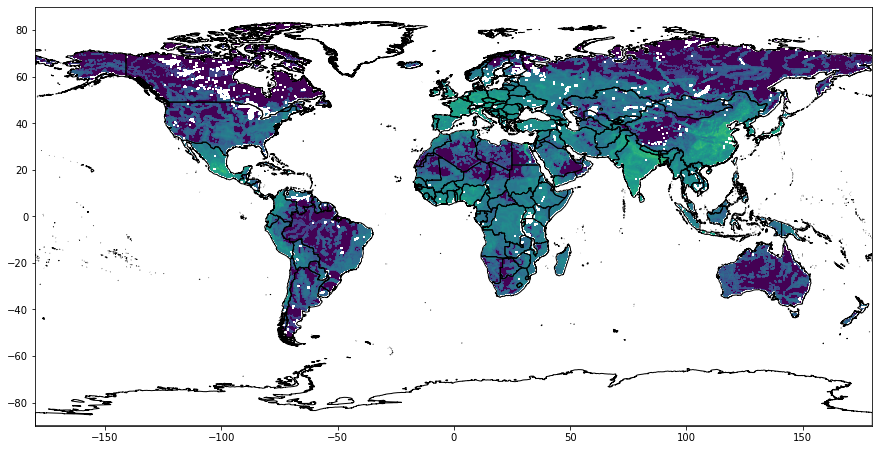

In [28]:
#plot population density in 1500
rast_o=rasterio.open(popd_cln.format(path=junkpath,y='1500'))
fig, ax = plt.subplots(figsize=(15, 15))
show(rast_o,norm=PowerNorm(gamma=0.1), ax=ax)
countries_gdf.plot(ax=ax, facecolor='none', edgecolor='black');

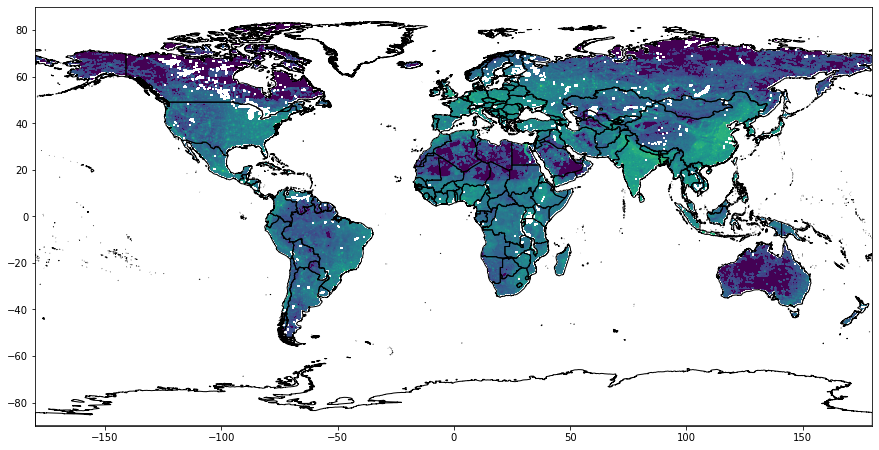

In [29]:
#plot population density in 1990
rast_o=rasterio.open(popd_cln.format(path=junkpath,y='1990'))
fig, ax = plt.subplots(figsize=(15, 15))
show(rast_o,norm=PowerNorm(gamma=0.1), ax=ax)
countries_gdf.plot(ax=ax, facecolor='none', edgecolor='black');

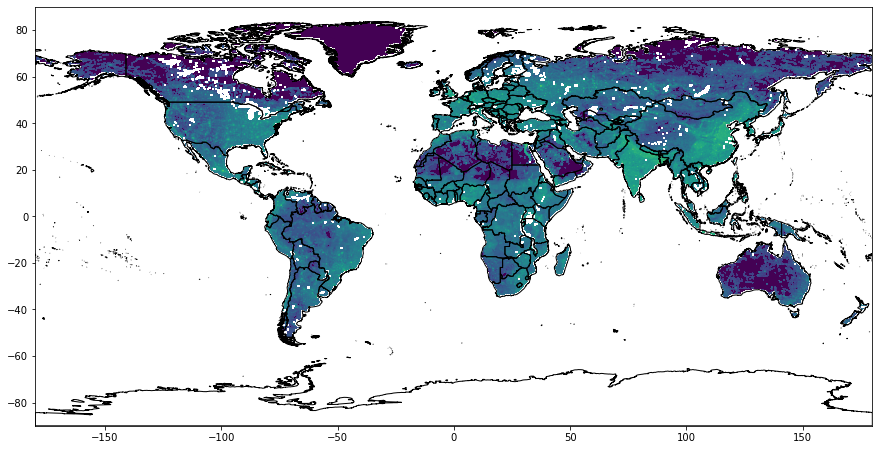

In [30]:
#plot population density in 2000
rast_o=rasterio.open(popd_cln.format(path=junkpath,y='2000'))
fig, ax = plt.subplots(figsize=(15, 15))
show(rast_o,norm=PowerNorm(gamma=0.1), ax=ax)
countries_gdf.plot(ax=ax, facecolor='none', edgecolor='black');

### 2.D. Clean elevation data <a class="anchor" id="sec2d"></a>
* NB: source data is large - skip if too much
    * Elevation is 1km from: https://cgiarcsi.community/data/srtm-90m-digital-elevation-database-v4-1/
    * Convert AIG raster to GeoTiff

In [31]:
# rast_o=rasterio.open(elev_in)
# prf=rast_o.profile.copy()
# prf.update({"driver": "GTiff"}) #switch from AIG to GEOTiff
# img_a=rast_o.read(1)
# with rasterio.open(elev_cln, 'w', **prf) as dst:
#     dst.write(img_a, 1)

In [32]:
# pyplot.imshow(rast_o.read(1, masked=True), cmap='viridis') #plot elevation raster

### 2.E. Clean climate data <a class="anchor" id="sec2e"></a>
* NB: source data is large - skip if too much
    * Temperature and precipitation are _monthly_ versions from https://www.worldclim.com/current


In [33]:
# #write a function that reutrns the numpy array for a raster file
# def read_rast(file):
#     with rasterio.open(file) as src:
#         return(src.read(1))

Temperature average across months

In [34]:
# # Get metadata from one of the input files
# with rasterio.open(temp_in.format(path=mainpath,month=1)) as rast_o:
#     prf = rast_o.profile.copy()

# array_list = [read_rast(temp_in.format(path=mainpath,month=m)) for m in range(1,12+1)] # list all monthly data as numpy arrays 
# temp_a = numpy.mean(array_list, axis=0).astype(prf['dtype']) # Perform averaging, output an integer array that matches input rasters

In [35]:
# prf.update({"driver": "GTiff"}) #switch from EHdr to GEOTiff

# with rasterio.open(temp_cln, 'w', **prf) as dst:
#     dst.write(temp_a, 1) # Write output file

In [36]:
# pyplot.imshow(rasterio.open(temp_cln).read(1, masked=True), cmap='viridis') #plot temperature raster

Precipitation average across months

In [37]:
# # Get metadata from one of the input files
# with rasterio.open(prec_in.format(path=mainpath,month=1)) as rast_o:
#     prf = rast_o.profile.copy()

# array_list = [read_rast(prec_in.format(path=mainpath,month=m)) for m in range(1,12+1)] # list all monthly data as numpy arrays 
# prec_a = numpy.mean(array_list, axis=0).astype(prf['dtype']) # Perform averaging, output an integer array that matches input rasters

In [38]:
# prf.update({"driver": "GTiff"}) #switch from EHdr to GEOTiff

# with rasterio.open(prec_cln, 'w', **prf) as dst:
#     dst.write(prec_a, 1) # Write output file

In [39]:
# pyplot.imshow(rasterio.open(prec_cln).read(1, masked=True), cmap='viridis') #plot precipitation raster

# 3. Country level analysis <a class="anchor" id="sec3"></a>

### 3.A. Aggregate data by country <a class="anchor" id="sec3a"></a>

In [40]:
popd1500  = popd_cln.format(path=junkpath,y='1500')
popd1990  = popd_cln.format(path=junkpath,y='1990')
popd2000  = popd_cln.format(path=junkpath,y='2000')

# RASTS = [suit_cln, popd1500,  popd1990, popd2000, elev_cln, temp_cln, prec_cln] #Make a list of rasters that we wish to aggregate
# PREFS = ['lqua_', 'pd15_', 'pd19_', 'pd20_','elev_', 'temp_', 'prec_'] #and a matching list of names

RASTS = [suit_cln, popd1500,  popd1990, popd2000]
PREFS = ['lqua_', 'pd15_', 'pd19_', 'pd20_']

#In case elevation and climate are too large to download/run - skip these. (Otherwise, the code will still run but will take time.)
# #RASTS=RASTS[:3]
# #PREFS=PREFS[:3]

In [41]:
countries_gdf=geopandas.read_file(cntrs_in) #Open the data
countries_gdf=countries_gdf[['ADMIN', 'ISO_A3', 'geometry']] #keep only necessary variables

Zonal Statistics (NB: This can take a few minutes)

In [42]:
start = time.time() #let's time how long each loop takes 
for idx, rast in enumerate(RASTS): # here we loop over the rasters
    pref = PREFS[idx] #get our preferred name of the raster
    stat_list=['mean'] #set list of stats to calculate, for now just do the mean
    zstats=rasterstats.zonal_stats(countries_gdf, rast, stats=stat_list)
    for st in stat_list: #add all stats to dataframe
        col_name=pref+st
        col_stat=[d[st] for d in zstats] #zonalstats outputs a list of dictionaries, this creates a list of values for stat
        countries_gdf[col_name]=col_stat
    time_elapsed = round(time.time()-start)
    print('It took {dt} seconds to run zonal stats (mean) for {p}'.format(dt=time_elapsed,p=pref))
    start = time.time()

It took 2 seconds to run zonal stats (mean) for lqua_
It took 3 seconds to run zonal stats (mean) for pd15_
It took 3 seconds to run zonal stats (mean) for pd19_
It took 3 seconds to run zonal stats (mean) for pd20_


In [43]:
countries_gdf.columns #make sure all statistics columns are there

Index(['ADMIN', 'ISO_A3', 'geometry', 'lqua_mean', 'pd15_mean', 'pd19_mean',
       'pd20_mean'],
      dtype='object')

In [44]:
countries_gdf=countries_gdf.drop(columns=['geometry']) #drop geometries from data frame

In [45]:
countries_gdf.to_csv(cntry_zs_csv) #save pandas DF as csv

### 3.B. Count languages for countries <a class="anchor" id="sec3b"></a>

In [40]:
cntr_gdf=geopandas.read_file(cntrs_in) #open country boundaries
wlds_gdf=geopandas.read_file(wlds_in) #open languages data

Intersection between languages and countries

In [41]:
cntr_wlds_int = geopandas.overlay(cntr_gdf, wlds_gdf, how='intersection')

In [42]:
# cntr_wlds_int.plot(figsize=(20, 15))

Calculate language statistics by country

In [43]:
cntr_wlds_int['count_langs']=1
cntr_wlds_count=cntr_wlds_int[['count_langs','ADMIN', 'ISO_A3']].groupby(['ADMIN', 'ISO_A3']).agg('count')

In [44]:
cntr_wlds_count.to_csv(cntry_nlangs_csv) #save pandas DF as csv

### 3.C. Calculate distances between countries and coast <a class="anchor" id="sec3c"></a>

In [45]:
admin_gdf=geopandas.read_file(cntrs_in) #open country boundaries (polygons)
coast_gdf=geopandas.read_file(coast_in) #open coastal boundaries (lines)

In [46]:
admin_gdf = admin_gdf.to_crs(crs=wcea_crs) #reproject to an equal-area coordinate system
coast_gdf = coast_gdf.to_crs(crs=wcea_crs) #reproject to an equal-area coordinate system

In [47]:
admin_gdf['geometry']=admin_gdf.centroid #replace country polygon, with it's centroid

In [48]:
admin_gdf['dist2coast_ea']=admin_gdf.geometry.apply(lambda x: coast_gdf.distance(x).min()/1000) #calculate nearest distance to coast for each country centroid

Wait! We are trying to calculate distances in a equal area prjection!

In [49]:
admin_gdf = admin_gdf.to_crs(crs=wgs84_crs) #reproject to WGS
coast_gdf = coast_gdf.to_crs(crs=wgs84_crs) #reproject to WGS

In [50]:
def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """

    lon1, lat1, lon2, lat2 = map(numpy.radians, [lon1, lat1, lon2, lat2]) # convert decimal degrees to radians 

    # haversine formula 
    dlon,dlat = lon2 - lon1 , lat2 - lat1 
    a = numpy.sin(dlat/2)**2 + numpy.cos(lat1) * numpy.cos(lat2) * numpy.sin(dlon/2)**2
    c = 2 * numpy.arcsin(numpy.sqrt(a)) 
    r = 6371 # Radius of earth in kilometers. Use 3956 for miles.
    return c * r

In [51]:
world_coast=coast_gdf.dissolve()
world_coast.geometry[0]

In [52]:
admin_gdf['coast_coords'] = admin_gdf.apply(lambda x: nearest_points(world_coast.geometry[0],x['geometry'])[0], axis=1)

In [53]:
admin_gdf['lon']=admin_gdf.geometry.x
admin_gdf['lat']=admin_gdf.geometry.y
admin_gdf['lon_coast']=admin_gdf.coast_coords.apply(lambda p: p.x)
admin_gdf['lat_coast']=admin_gdf.coast_coords.apply(lambda p: p.y)

In [54]:
admin_gdf['dist2coast']=haversine(admin_gdf['lon'],admin_gdf['lat'],admin_gdf['lon_coast'],admin_gdf['lat_coast']) #calculate nearest distance to coast for each country centroid

In [58]:
admin_gdf[['ne_10m_adm','dist2coast_ea','dist2coast']]

,ne_10m_adm,dist2coast_ea,dist2coast
0,ABW,3.368553,3.389350
1,AFG,784.516734,905.288799
2,AGO,419.271863,409.912679
3,AIA,1.359363,1.360756
4,ALB,60.850897,47.173928
...,...,...,...
248,WSM,5.146491,5.148532
249,YEM,201.874006,209.120287
250,ZAF,466.299486,543.074937
251,ZMB,996.447294,993.674056


In [59]:
admin_gdf.drop_duplicates(subset='ne_10m_adm').shape

(253, 39)

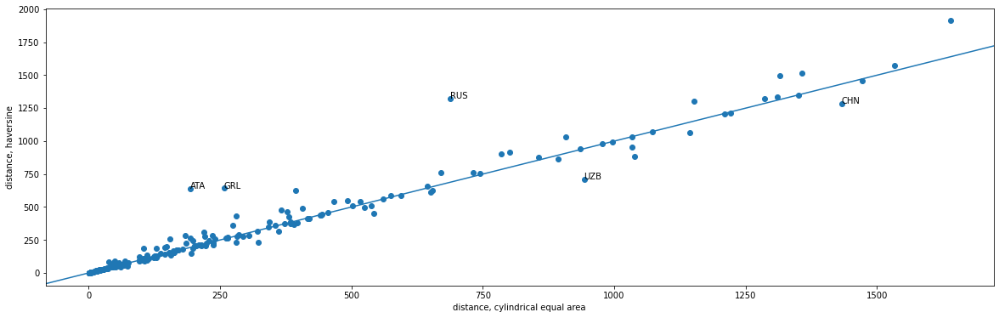

In [69]:
f, ax = plt.subplots(figsize=(20, 6))
ax.scatter(admin_gdf.dist2coast_ea, admin_gdf.dist2coast)
ax.set_xlabel('distance, cylindrical equal area')
ax.set_ylabel('distance, haversine')
ax.axline([0, 0], [1, 1])
for i, txt in enumerate(admin_gdf.ne_10m_adm):
    if txt=="ATA" or txt=="GRL" or txt=="RUS" or txt=="UZB" or txt=="CHN":
        ax.annotate(txt, (admin_gdf.dist2coast_ea[i], admin_gdf.dist2coast[i]))
plt.show()

In [63]:
admin_gdf[['ADMIN', 'ISO_A3','dist2coast']].to_csv(cntry2coast_csv) #save pandas DF as csv

### 3.D. Calculate country areas <a class="anchor" id="sec3d"></a>

In [64]:
admin_gdf=geopandas.read_file(cntrs_in)

In [65]:
admin_gdf=admin_gdf.loc[:,('geometry', 'ne_10m_adm', 'ADMIN', 'ISO_A3')] #drop unnecessary fields

In [66]:
admin_gdf['km2area']=admin_gdf['geometry'].to_crs(wcea_crs).area / 10**6 #calculate country area in square kilometers (after reprojecting to an equal-area CRS)

In [67]:
admin_gdf.head()

,geometry,ne_10m_adm,ADMIN,ISO_A3,km2area
0,"POLYGON ((-69.87609 12.42720, -69.88738 12.417...",ABW,Aruba,ABW,1.697625e+02
1,"POLYGON ((71.02458 38.44192, 71.03296 38.42365...",AFG,Afghanistan,AFG,6.421811e+05
2,"MULTIPOLYGON (((11.74148 -16.72017, 11.78024 -...",AGO,Angola,AGO,1.244785e+06
3,"MULTIPOLYGON (((-63.03690 18.21277, -63.09881 ...",AIA,Anguilla,AIA,8.217755e+01
4,"POLYGON ((20.06496 42.54676, 20.08563 42.53001...",ALB,Albania,ALB,2.832650e+04


In [68]:
admin_gdf[['ne_10m_adm', 'ADMIN', 'ISO_A3', 'km2area']].to_csv(cntry_areas_csv) #save pandas DF as csv

# 4. 'Virtual country' level analysis <a class="anchor" id="sec4"></a>
### 4.A. Build Grid for virtual countries <a class="anchor" id="sec4a"></a>

Create grid covering the world

In [69]:
xmin, ymin, xmax, ymax = -180, -90, 180, 90 #cover the entire world
l,w = 2.5,2.5 #each cell 2.5 degrees
cols,rows = numpy.arange(xmin, xmax, w), numpy.arange(ymin, ymax, l)

In [70]:
polygons = [Polygon([(x,y), 
                     (x+w, y),
                     (x+w, y+l),
                     (x, y+l)]) for x in cols for y in rows]
grid_gdf = geopandas.GeoDataFrame({'geometry':polygons}).set_crs(wgs84_crs) #create geodataframe from polygon shpes, and set crs to WGS 1984
grid_gdf.insert(0, 'aux_id', range(len(grid_gdf))) #make unique ID for each grid cell

Intersect grid with dissolved countries to remove oceans

In [71]:
admin_gdf=geopandas.read_file(cntrs_in).loc[:,('geometry', 'ne_10m_adm', 'ADMIN', 'ISO_A3')]

In [72]:
grid_admin_int_gdf = geopandas.overlay(grid_gdf, admin_gdf, how='intersection') #intersect countries and grid

<AxesSubplot:>

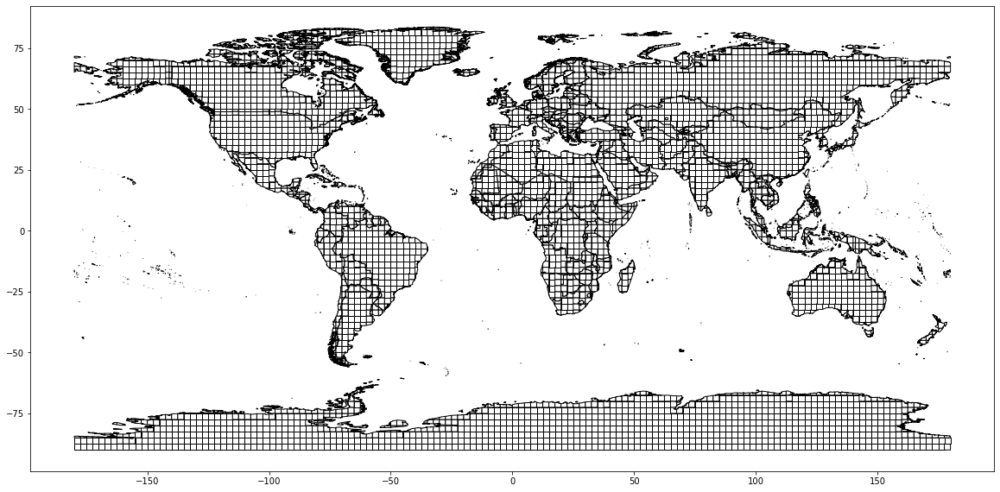

In [73]:
grid_admin_int_gdf.plot(figsize=(20, 15), edgecolor='black', color='w')

In [74]:
grid_admin_dss_gdf = grid_admin_int_gdf.dissolve(by='aux_id') #dissolve back to grid squares

In [75]:
grid_admin_dss_gdf.insert(0, 'cid', range(len(grid_admin_dss_gdf))) #make unique ID for each grid cell

Stop: after the intersection, check for small cracks where country boundaries weren't perfectly aligned
NB: this step can be easier to check in QGIS, by hand. But we can also check here, let's inspect the border between Mexico and Guatemala

<AxesSubplot:>

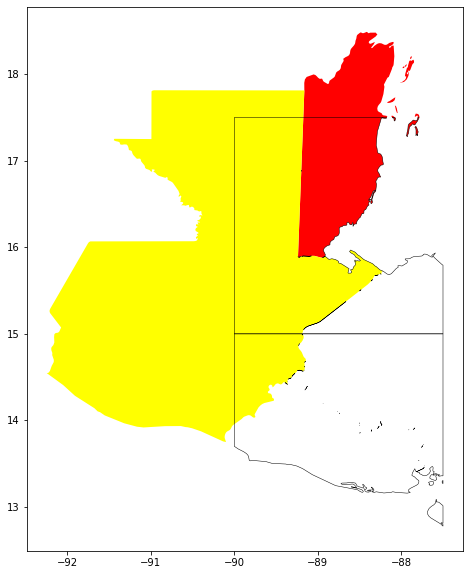

In [76]:
base = admin_gdf.loc[(admin_gdf['ADMIN']=='Belize') | 
                     (admin_gdf['ADMIN']=='Guatemala')].plot(column='ADMIN', cmap='autumn', figsize=(15, 10))
grid_admin_dss_gdf.loc[(grid_admin_dss_gdf['ADMIN']=='Belize') | 
                       (grid_admin_dss_gdf['ADMIN']=='Guatemala')].boundary.plot(ax=base,color='black',linewidth=0.5, figsize=(15, 10))

We can see in the above that some of the border between Guatemala (yellow) and Belize (red) is not perfectly closed, so the virtual countries have some holes

In [77]:
#We can first fill up holes by buffering outwards
grid_admin_dss_gdf=grid_admin_dss_gdf.to_crs(wcea_crs)
grid_admin_dss_gdf['geometry']=grid_admin_dss_gdf.buffer(100) #The positive buffer fills up very tiny holes, and expands boundaries (by 100 metres)

<AxesSubplot:>

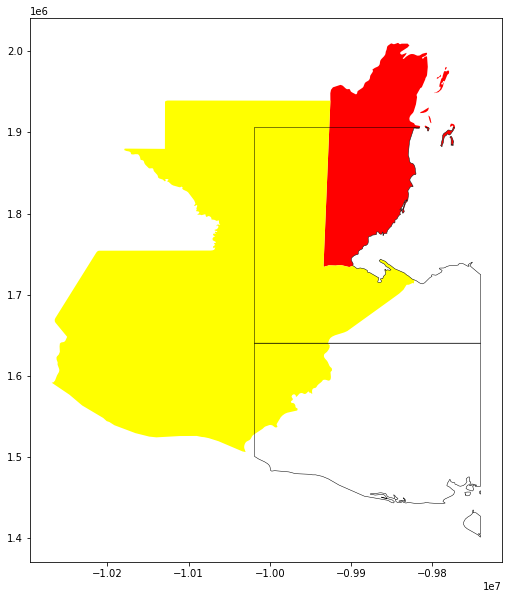

In [78]:
#Now, looking back at Central America, the holes that were at the border of Guatemala and Belize have been filled up
#BUT, now the virtual countries have been expanded by 100meters in every direction...
base = admin_gdf.to_crs(wcea_crs).loc[(admin_gdf['ADMIN']=='Belize') | 
                                      (admin_gdf['ADMIN']=='Guatemala')].plot(column='ADMIN', cmap='autumn', figsize=(15, 10))
grid_admin_dss_gdf.loc[(grid_admin_dss_gdf['ADMIN']=='Belize') | 
                       (grid_admin_dss_gdf['ADMIN']=='Guatemala')].boundary.plot(ax=base,color='black',linewidth=0.5)

In [79]:
#So now we buffer backwards to put the vrtual country boundaries back in their original place
grid_admin_dss_gdf['geometry']=grid_admin_dss_gdf.buffer(-100) #The negative buffer brings bounaries back to where they were before, but the tiny holes stay plugged
grid_admin_dss_gdf=grid_admin_dss_gdf.to_crs(wgs84_crs)

<AxesSubplot:>

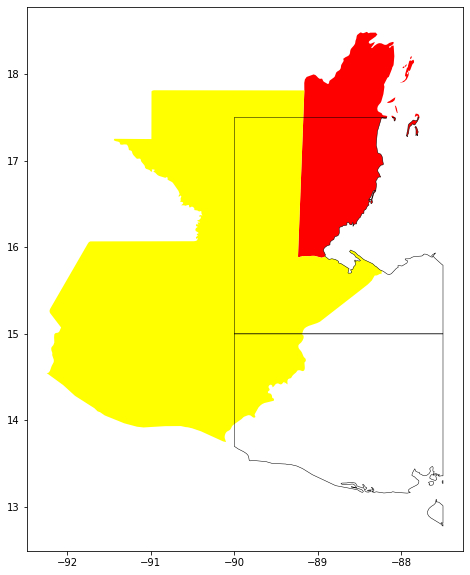

In [80]:
#Now, the borders have returned to their original place, but all holes are filled up
base = admin_gdf.loc[(admin_gdf['ADMIN']=='Belize') | 
                     (admin_gdf['ADMIN']=='Guatemala')].plot(column='ADMIN', cmap='autumn', figsize=(15, 10))
grid_admin_dss_gdf.loc[(grid_admin_dss_gdf['ADMIN']=='Belize') | 
                       (grid_admin_dss_gdf['ADMIN']=='Guatemala')].boundary.plot(ax=base,color='black',linewidth=0.5)

Save the dissolved cells after having removed the intersection holes

In [81]:
grid_admin_dss_gdf.loc[:,('cid','geometry')].to_file(vc_shp) #save pandas DF as shapefile

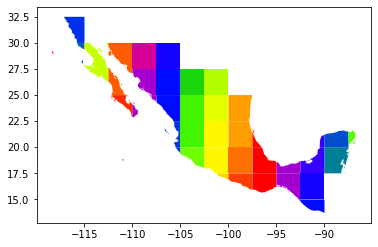

In [82]:
#plot virtual countries in mexico
grid_admin_dss_gdf[grid_admin_dss_gdf['ADMIN']=='Mexico'].plot(column='cid', cmap='prism'); 

### 4.B. Count languages for virtual countries <a class="anchor" id="sec4b"></a>

In [83]:
wlds_gdf=geopandas.read_file(wlds_cln)
vc_gdf=geopandas.read_file(vc_shp)

In [84]:
vc_wlds_int_gdf = geopandas.overlay(vc_gdf, wlds_gdf, how='intersection',keep_geom_type=True)

In [85]:
vc_wlds_int_gdf = vc_wlds_int_gdf.dissolve(by=['cid','lnm']) #dissolve to VC x language (we are doing this since the unit in wlds is language X country)

In [86]:
vc_wlds_int_gdf['count_langs']=1
vc_wlds_cnt_gdf=vc_wlds_int_gdf[['count_langs']].groupby(['cid']).agg('count') #count languages in virtual countries
vc_wlds_cnt_gdf.to_csv(vc_nlangs_csv) #save pandas DF as csv

Keep a record of virtual countries with AND without languages

In [ ]:
vc_wlangs_gdf=pandas.merge(vc_gdf,vc_wlds_cnt_gdf,on='cid',how='left',indicator=True)
vc_wlangs_gdf

In [ ]:
vc_wlangs_gdf[vc_wlangs_gdf._merge=='both'][['cid','geometry']].to_file(vc_wlangs_shp) #save pandas DF as shapefile
vc_wlangs_gdf[vc_wlangs_gdf._merge=='left_only'][['cid','geometry']].to_file(vc_wolangs_shp) #save pandas DF as shapefile

### 4.C. Calculate land and water area for virtual countries <a class="anchor" id="sec4c"></a>

In [99]:
vc_gdf=geopandas.read_file(vc_wlangs_shp)
water_gdf=geopandas.read_file(water_in)

In [100]:
#calculate country area in square kilometers (after reprojecting to an equal-area CRS)
vc_gdf['km2area']=vc_gdf['geometry'].to_crs(wcea_crs).area / 10**6 

In [101]:
vc_water_int_gdf = geopandas.overlay(vc_gdf, water_gdf, how='intersection',keep_geom_type=True)

In [102]:
#dissolve the vc - water areas to vc shapes
vc_water_dss_gdf = vc_water_int_gdf.dissolve(by='cid') 

In [103]:
#calculate country-water area in square kilometers (after reprojecting to an equal-area CRS)
vc_water_dss_gdf['km2warea']=vc_water_dss_gdf['geometry'].to_crs(wcea_crs).area / 10**6 

In [104]:
vc_gdf.loc[:,('cid','km2area')].to_csv(vc_areas_csv) #save vc areas as csv
vc_water_dss_gdf.loc[:,('km2warea')].to_csv(vc_waterarea_csv, index=True) #save vc-water areas as csv

### 4.D. Calculate distances between virtual countries and coast <a class="anchor" id="sec4d"></a>

In [105]:
vc_langs_gdf=geopandas.read_file(vc_wlangs_shp) #open vc boundaries (polygons)
coast_gdf=geopandas.read_file(coast_in) #open coastal boundaries (lines)

In [106]:
vc_langs_gdf=vc_langs_gdf.to_crs(crs=wcea_crs) #reproject to an equal-area coordinate system

In [107]:
vc_langs_gdf['geometry']=vc_langs_gdf.centroid #replace country polygon, with it's centroid

In [108]:
vc_langs_gdf = vc_langs_gdf.to_crs(crs=wgs84_crs) #reproject to WGS
coast_gdf = coast_gdf.to_crs(crs=wgs84_crs) #reproject to WGS
world_coast=coast_gdf.dissolve() #dissolve to one world coast

In [109]:
vc_langs_gdf['coast_coords'] = vc_langs_gdf.apply(lambda x: nearest_points(world_coast.geometry[0],
                                                                     x['geometry'])[0], axis=1)

In [110]:
vc_langs_gdf['lon']=vc_langs_gdf.geometry.x
vc_langs_gdf['lat']=vc_langs_gdf.geometry.y
vc_langs_gdf['lon_coast']=vc_langs_gdf.coast_coords.apply(lambda p: p.x)
vc_langs_gdf['lat_coast']=vc_langs_gdf.coast_coords.apply(lambda p: p.y)

In [111]:
vc_langs_gdf['dist2coast']=haversine(
            vc_langs_gdf['lon'],vc_langs_gdf['lat'],
            vc_langs_gdf['lon_coast'],vc_langs_gdf['lat_coast'])

In [112]:
vc_langs_gdf[['cid','dist2coast', 'lon', 'lat', 'lon_coast', 'lat_coast']].to_csv(vc2coast_csv) #save pandas DF as csv

### 4.E. Aggregate data by virtual countries <a class="anchor" id="sec4e"></a>

In [113]:
popd1500  = popd_cln.format(path=junkpath,y='1500')
popd1990  = popd_cln.format(path=junkpath,y='1990')
popd2000  = popd_cln.format(path=junkpath,y='2000')

# RASTS = [suit_cln, popd1500,  popd1990, popd2000, elev_cln, temp_cln, prec_cln] #Make a list of rasters that we wish to aggregate
# PREFS = ['lqua_', 'pd15_', 'pd19_', 'pd20_','elev_', 'temp_', 'prec_'] #and a matching list of names

RASTS = [suit_cln, popd1500,  popd1990, popd2000]
PREFS = ['lqua_', 'pd15_', 'pd19_', 'pd20_']

#In case elevation and climate are too large to download/run - skip these. (Otherwise, the code will still run but will take time.)
##RASTS=RASTS[:3]
##PREFS=PREFS[:3]

In [114]:
vc_langs_gdf=geopandas.read_file(vc_wlangs_shp) #open vc boundaries (polygons)
vc_nolangs_gdf=geopandas.read_file(vc_wolangs_shp) #open vc boundaries (polygons)

Zonal stats

In [115]:
start = time.time() #let's time how long each loop takes 
for f in [vc_langs_gdf,vc_nolangs_gdf]: #loop over each type of vitual countries (with and without languages)
    for idx, rast in enumerate(RASTS): # here we loop over the rasters
        pref = PREFS[idx] #get our preferred name of the raster
        stat_list=['mean'] #set list of stats to calculate, for now just do the mean
        zstats=rasterstats.zonal_stats(f, rast, stats=stat_list)
        for st in stat_list: #add all stats to dataframe
            col_name=pref+st
            col_stat=[d[st] for d in zstats] #zonalstats outputs a list of dictionaries, this creates a list of values for stat
            f[col_name]=col_stat
        time_elapsed = round(time.time()-start)
        print('It took {dt} seconds to run zonal stats (mean) for {p}'.format(dt=time_elapsed,p=pref))
        start = time.time()

It took 14 seconds to run zonal stats (mean) for lqua_
It took 15 seconds to run zonal stats (mean) for pd15_
It took 15 seconds to run zonal stats (mean) for pd19_
It took 15 seconds to run zonal stats (mean) for pd20_
It took 25 seconds to run zonal stats (mean) for lqua_
It took 26 seconds to run zonal stats (mean) for pd15_
It took 27 seconds to run zonal stats (mean) for pd19_
It took 26 seconds to run zonal stats (mean) for pd20_


In [116]:
vc_langs_gdf.columns #make sure all statistics columns are there

Index(['cid', 'geometry', 'lqua_mean', 'pd15_mean', 'pd19_mean', 'pd20_mean'], dtype='object')

In [117]:
vc_nolangs_gdf.columns #make sure all statistics columns are there

Index(['cid', 'geometry', 'lqua_mean', 'pd15_mean', 'pd19_mean', 'pd20_mean'], dtype='object')

In [118]:
vc_langs_gdf.drop(columns=['geometry']).to_csv(vc_zs_csv) #save pandas DF as csv
vc_nolangs_gdf.drop(columns=['geometry']).to_csv(vc_wolangs_zs_csv) #save pandas DF as csv

# 5. Dyad level analysis <a class="anchor" id="sec5"></a>
### 5.A. Create dyad cells <a class="anchor" id="sec5a"></a>

Build grid

In [119]:
xmin, ymin, xmax, ymax = -180, -90, 180, 90 #cover the entire world
l,w = 0.5,0.5 #each cell 0.5 degrees
cols,rows = numpy.arange(xmin, xmax, w), numpy.arange(ymin, ymax, l)

In [120]:
polygons = [Polygon([(x,y), 
                     (x+w, y),
                     (x+w, y+l),
                     (x, y+l)]) for x in cols for y in rows]
grid_gdf = geopandas.GeoDataFrame({'geometry':polygons}).set_crs(wgs84_crs) #create geodataframe from polygon shpes, and set crs to WGS 1984
grid_gdf.insert(0, 'aux_id', range(len(grid_gdf))) #make unique ID for each grid cell

Intersect grid with dissolved countries to remove oceans
* NB: this runs very slowly (on my machine it takes a couple minutes). Let me know if you are not able to and want to run the full code, and I can send you the output of this tool

In [121]:
admin_gdf=geopandas.read_file(cntrs_in).loc[:,('geometry', 'ne_10m_adm', 'ADMIN', 'ISO_A3')]

In [122]:
grid_admin_int_gdf = geopandas.overlay(grid_gdf, admin_gdf, how='intersection') #intersect countries and grid

In [123]:
grid_admin_dss_gdf = grid_admin_int_gdf.dissolve(by='aux_id') #dissolve back to grid squares
grid_admin_dss_gdf.insert(0, 'cid', range(len(grid_admin_dss_gdf))) #make unique ID for each dissolved grid cell
grid_admin_dss_gdf=grid_admin_dss_gdf.loc[:,('cid','geometry')] #keep only relevant columns

Clean dissolved cells to remove slight intersection lines

In [124]:
grid_admin_dss_gdf=grid_admin_dss_gdf.to_crs(wcea_crs)
grid_admin_dss_gdf['geometry']=grid_admin_dss_gdf.buffer(100) #The positive buffer fills up very tiny holes, and expands boundaries (by 100 metres)
grid_admin_dss_gdf['geometry']=grid_admin_dss_gdf.buffer(-100) #The negative buffer brings bounaries back to where they were before, but the tiny holes stay plugged
grid_admin_dss_gdf=grid_admin_dss_gdf.to_crs(wgs84_crs)

In [125]:
grid_admin_dss_gdf.to_file(dyad_shp) #save pandas DF as shapefile

### 5.B. Languages spoken in dyad cells <a class="anchor" id="sec5b"></a>

In [126]:
# wlds_gdf=geopandas.read_file(wlds_cln)
# dyad_gdf=geopandas.read_file(dyad_shp)

Spatially join languages with dyad cells
* NB: this runs very slowly (on my machine it takes an hour and 15 minutes). Let me know if you are not able to and want to run the full code, and I can send you the output of this tool

In [127]:
# start = time.time()
# dyad_langs_gdf = geopandas.sjoin(dyad_gdf, wlds_gdf, how="left", op='intersects') 
# #'left' ensures that we keep the geometry and index from dyads
# #'intersects' ensures that we count all overlaps of a boundary or interior between the two sets of geometries
# time_elapsed = round(time.time()-start)
# print('It took {dt} seconds to run the spatial join'.format(dt=time_elapsed,p=pref))

In [128]:
# dyad_langs_gdf.to_csv(dyad_langs_csv) #save pandas DF as csv

### 5.C. Calculate land and water area for dyad cells <a class="anchor" id="sec5c"></a>

In [129]:
# dyad_gdf=geopandas.read_file(dyad_shp)
# water_gdf=geopandas.read_file(water_in)

In [130]:
# #calculate country area in square kilometers (after reprojecting to an equal-area CRS)
# dyad_gdf['km2area']=dyad_gdf['geometry'].to_crs(wcea_crs).area / 10**6 

In [131]:
# dyad_water_int_gdf = geopandas.overlay(dyad_gdf, water_gdf, how='intersection',keep_geom_type=True)

In [132]:
# #dissolve the vc - water areas to vc shapes
# dyad_water_dss_gdf = dyad_water_int_gdf.dissolve(by='cid') 

In [133]:
# #calculate country-water area in square kilometers (after reprojecting to an equal-area CRS)
# dyad_water_dss_gdf['km2warea']=dyad_water_dss_gdf['geometry'].to_crs(wcea_crs).area / 10**6 

In [134]:
# dyad_gdf.loc[:,('cid','km2area')].to_csv(dyad_areas_csv) #save vc areas as csv
# dyad_water_dss_gdf.loc[:,('km2warea')].to_csv(dyad_waterarea_csv, index=True) #save vc-water areas as csv

### 5.D. Calculate distances between dyad cells and coast <a class="anchor" id="sec5d"></a>

In [135]:
# dyad_gdf=geopandas.read_file(dyad_shp) #open vc boundaries (polygons)
# coast_gdf=geopandas.read_file(coast_in) #open coastal boundaries (lines)

In [136]:
# dyad_gdf=dyad_gdf.to_crs(crs=wcea_crs) #reproject to an equal-area coordinate system
# dyad_gdf['geometry']=dyad_gdf.centroid #replace country polygon, with it's centroid
# dyad_gdf = dyad_gdf.to_crs(crs=wgs84_crs) #reproject to WGS

In [137]:
# coast_gdf = coast_gdf.to_crs(crs=wgs84_crs) #reproject to WGS
# world_coast=coast_gdf.dissolve() #dissolve to one world coast

Calculate coordinates of nearest coastal point 
* NB: this runs slowly (on my machine it takes 12 minutes). Let me know if you are not able to and want to run the full code, and I can send you the output of this tool

In [138]:
# start = time.time()
# dyad_gdf['coast_coords'] = dyad_gdf.apply(lambda x: nearest_points(world_coast.geometry[0],x['geometry'])[0], axis=1)
# time_elapsed = round(time.time()-start)
# print('It took {dt} seconds to calculate distances'.format(dt=time_elapsed,p=pref))

In [139]:
# dyad_gdf['lon']=dyad_gdf.geometry.x
# dyad_gdf['lat']=dyad_gdf.geometry.y
# dyad_gdf['lon_coast']=dyad_gdf.coast_coords.apply(lambda p: p.x)
# dyad_gdf['lat_coast']=dyad_gdf.coast_coords.apply(lambda p: p.y)

Calculate distance to coast 
* NB: this runs very slowly (on my machine it takes an hour and 25 minutes). Let me know if you are not able to and want to run the full code, and I can send you the output of this tool

In [140]:
# start = time.time()
# dyad_gdf['dist2coast']=haversine(dyad_gdf['lon'],dyad_gdf['lat'],dyad_gdf['lon_coast'],dyad_gdf['lat_coast'])

In [141]:
# dyad_gdf[['cid','dist2coast', 'lon', 'lat', 'lon_coast', 'lat_coast']].to_csv(dyad2coast_csv) #save pandas DF as csv

### 5.E. Aggregate data by dyad cells <a class="anchor" id="sec5e"></a>

In [142]:
# popd1500  = popd_cln.format(path=junkpath,y='1500')
# popd1990  = popd_cln.format(path=junkpath,y='1990')
# popd2000  = popd_cln.format(path=junkpath,y='2000')

# RASTS = [suit_cln, popd1500,  popd1990, popd2000, elev_cln, temp_cln, prec_cln] #Make a list of rasters that we wish to aggregate
# PREFS = ['lqua_', 'pd15_', 'pd19_', 'pd20_','elev_', 'temp_', 'prec_'] #and a matching list of names

# #In case elevation and climate are too large to download/run - skip these. (Otherwise, the code will still run but will take time.)
# ##RASTS=RASTS[:3]
# ##PREFS=PREFS[:3]

In [143]:
# wgs84_crs = CRS.from_string('EPSG:4326') # define WGS 1984
# wcea_crs = CRS.from_string("esri:54034") #World cylindical equal area projection

In [144]:
# dyad_gdf=geopandas.read_file(dyad_shp) #open dyad boundaries (polygons)

In [145]:
# dyad_gdf = dyad_gdf.to_crs(wcea_crs)
# centroids = geopandas.GeoDataFrame({'geometry': dyad_gdf.geometry.centroid,
#                               'cid': dyad_gdf.cid}).to_crs(epsg=4326)

Extract values to point 
* NB: this runs very slowly (on my machine it takes an hour and ten minutes). Let me know if you are not able to and want to run the full code, and I can send you the output of this tool

In [146]:
# start = time.time() #let's time how long each loop takes 
# for idx, rast in enumerate(RASTS): # here we loop over the rasters
#     pref = PREFS[idx] #get our preferred name of the raster
#     centroids[pref] = rasterstats.point_query(centroids,rast,interpolate='nearest')
#     time_elapsed = round(time.time()-start)
#     print('It took {dt} seconds to run extract values to points (mean) for {p}'.format(dt=time_elapsed,p=pref))
#     start = time.time()

In [147]:
# centroids.columns

In [148]:
# centroids

In [149]:
# centroids[['cid','lqua_', 'pd15_', 'pd19_', 'pd20_','elev_', 'temp_', 'prec_']].to_csv(dyad2coast_csv)

### 5.F. Create polygon neighbours <a class="anchor" id="sec5f"></a>

In [150]:
dyad_gdf=geopandas.read_file(dyad_shp) #open dyad boundaries (polygons)

In [151]:
dyad_gdf.shape

(94546, 3)

In [152]:
#This takes a very long time to run, just test it on the first 1000 dyads for now
dyad_gdf=dyad_gdf[:1000]

In [153]:
npairs=[]
for index, row in dyad_gdf.iterrows():  
    neighbors = dyad_gdf[~dyad_gdf.geometry.disjoint(row.geometry)].cid.tolist() # Consider a feature as 'neighbor' if it touches a feature (i.e. NOT 'disjoint')
    neighbors.remove(row.cid) #remove self as neighbour
    for n in neighbors:
        npairs.append([row['cid'], n])

In [154]:
df = pandas.DataFrame(data=npairs, columns=["cid", "ncid"]) 
df.to_csv(dyad_nghbs_csv) #save dyads and their neighbour pairs

##### That was very slow, so lets use a more sophisticated method using pygeos

In [155]:
import pygeos

In [156]:
dyad_gdf=geopandas.read_file(dyad_shp) #open dyad boundaries (polygons)

In [157]:
pygeos_array = pygeos.io.from_shapely(dyad_gdf.geometry) #convert the dyad geometries to a pygeos array 

In [158]:
tree = pygeos.STRtree(pygeos_array) # Create a spatial tree so that spatial overlaps can be searched quickly. 

In [159]:
neighbors = tree.query_bulk(pygeos_array) #find all touching geometries by searching through the R-tree

In [160]:
neighbors_df = pandas.DataFrame(neighbors.T, columns=['cid', 'ncid']) #create a pandas dataframe of neighbours

In [161]:
neighbors_df = neighbors_df[neighbors_df.cid != neighbors_df.ncid].reset_index(drop=True) #remove self as neighbour

In [162]:
neighbors_df.to_csv(dyad_nghbs_csv) #save dyads and their neighbour pairs

##### This highlights the improvements that can be made by vectorizing the code. What would have taken days in a loop, is almost instant using an R-tree search

Let's visualize the neighbours

In [163]:
N5600=neighbors_df[neighbors_df['cid']==5600]['ncid']
neighbors_df[neighbors_df['cid']==5600] #who are the neighbours of cid 5600?

,cid,ncid
39397,5600,5708
39398,5600,5599
39399,5600,5493
39400,5600,5494
39401,5600,5709
39402,5600,5495
39403,5600,5710
39404,5600,5601


In [164]:
#open a window of the grid around our selected cell (5600)
bounds=dyad_gdf[dyad_gdf['cid']==5600].to_crs(wcea_crs).envelope.buffer(10**5, cap_style = 3) #window of 100 kilometers around our selected cell
grid=geopandas.read_file(dyad_shp,bbox=bounds)

In [165]:
grid['color'] = numpy.nan
grid.loc[grid.cid == 5600, 'color'] = 1 #give 'self' one color
for n in N5600:
    grid.loc[(grid.cid == n), 'color'] = 2 #give 'neighbours' another color

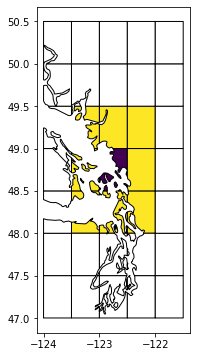

In [166]:
f, ax = plt.subplots(1,1, figsize=(10, 6))
grid.plot(ax=ax, 
          column='color', 
          edgecolor='black', 
          missing_kwds = dict(color='white', label='No Data'))
plt.show()